In [ ]:
# Connect to Drive
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
# Path of Input Image
path_input_image  = "/content/gdrive/MyDrive/Pores_Segmentation/test_images/Side2_000014.tif"
# Path of Model Weights file
path_model_weights = "/content/gdrive/MyDrive/Pores_Segmentation/model_2.h5"

In [ ]:
# install segmentation-models package to import UNET
%env SM_FRAMEWORK=tf.keras
!pip install segmentation-models                          # for UNET
# install patchify to split and merge large images
!pip install patchify                                     # to split and merge large images into smaller patches

# import libraries
import numpy as np
from matplotlib import pyplot as plt
from patchify import patchify, unpatchify
import cv2
from google.colab.patches import cv2_imshow
import random
import numpy as np
import segmentation_models as sm
import os

# Define Model
BACKBONE = 'resnet34'
model = sm.Unet(BACKBONE, encoder_weights='imagenet')
model.compile('Adam', loss=sm.losses.bce_jaccard_loss, metrics=[sm.metrics.iou_score])
# Load saved model weights
model.load_weights(path_model_weights)
print("MODEL LOADED SUCCESSFULLY")

env: SM_FRAMEWORK=tf.keras
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 KB 4.4 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Segmentation Models: using `tf.keras` framework.
85521592/85521592 [==============================] - 2s 0us/step
MODEL LOADED SUCCESSFULLY


img_shape :  (1536, 2048)
input image :


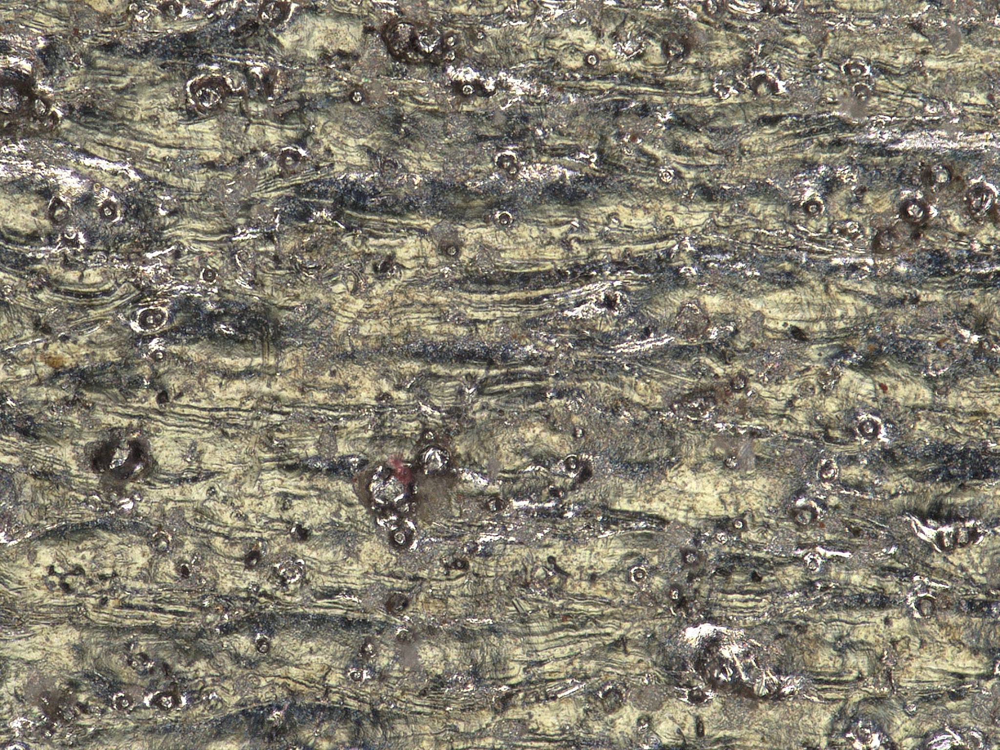

------
output image :


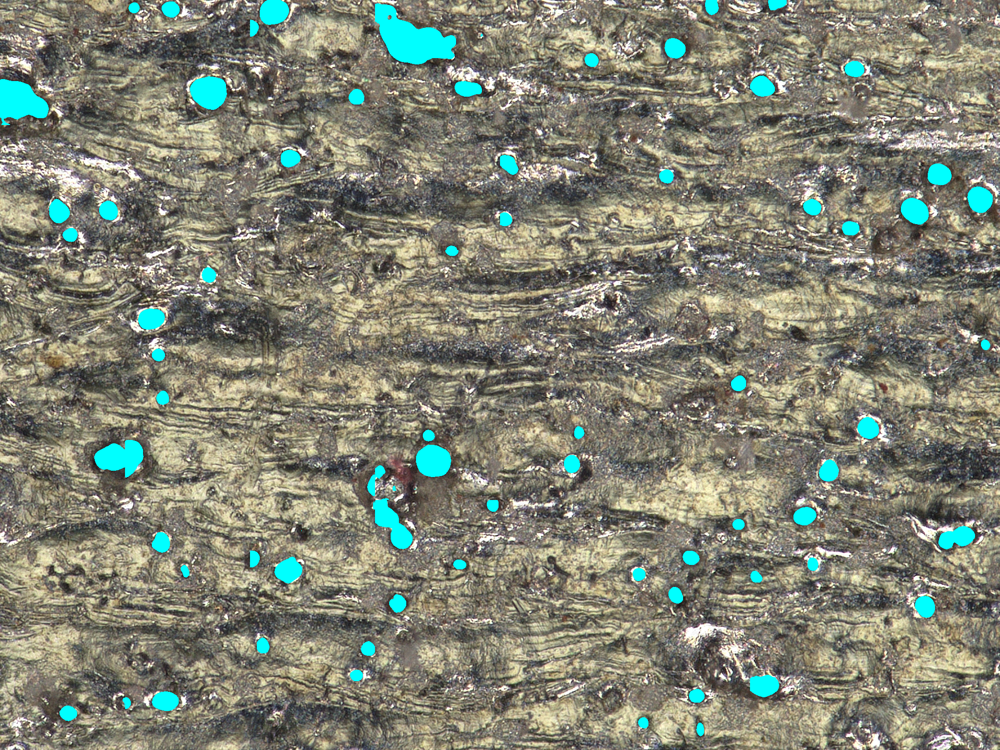

True

In [ ]:
# Load raw image
raw_image = cv2.imread(path_input_image, cv2.IMREAD_UNCHANGED)
large_image = cv2.imread(path_input_image, 0)

#This will split the image into small images of shape [3,3]
patches = patchify(large_image, (256, 256), step=256)  #Step=256 for 256 patches means no overlap
# break test image into patches and predict
predicted_patches = []
for i in range(patches.shape[0]):
  for j in range(patches.shape[1]):
    single_patch = patches[i,j,:,:]
    single_patch_img = (single_patch.astype('float32')) / 255.
    single_patch_img = np.stack((single_patch_img,)*3, axis=-1)
    single_patch_img = single_patch_img.reshape(1,single_patch_img.shape[0],single_patch_img.shape[1],single_patch_img.shape[2])
    #Predict and threshold for values above 0.5 probability
    single_patch_prediction = (model.predict(single_patch_img,verbose = 0)[0,:,:,0] > 0.5).astype(np.uint8)
    predicted_patches.append(single_patch_prediction)
predicted_patches = np.array(predicted_patches)

# reconstruct large images from predicted patches
predicted_patches_reshaped = np.reshape(predicted_patches, (patches.shape[0], patches.shape[1], 256,256) )
reconstructed_image = unpatchify(predicted_patches_reshaped, large_image.shape)
final_prediction = (reconstructed_image > 0.01).astype(np.uint8)

ret,thresh1 = cv2.threshold(reconstructed_image,0,255,cv2.THRESH_BINARY)
print("img_shape : ",thresh1.shape)
#------------------------------------------
print("input image :")
cv2_imshow(raw_image)
print("------")
input2 = raw_image.copy()
input2[thresh1==255]=(255,255,0)
print("output image :")
cv2_imshow(input2)
#-------------------------------------------
cv2.imwrite('/content/gdrive/MyDrive/Pores_Segmentation/test_results/14.tiff',input2)